# Combining Grounding DINO with Segment Anything (SAM) for text-based mask generation

In this notebook, we're going to combine 2 very cool models - [Grounding DINO](https://huggingface.co/docs/transformers/main/en/model_doc/grounding-dino) and [SAM](https://huggingface.co/docs/transformers/en/model_doc/sam). We'll use Grounding DINO to generate bounding boxes based on text prompts, after which we can prompt SAM to generate corresponding segmentation masks for them.

This is based on the popular [Grounded Segment Anything](https://github.com/IDEA-Research/Grounded-Segment-Anything) project - just with fewer lines of code as the models are now available in the Transformers library. Refer to the [paper](https://arxiv.org/abs/2401.14159) for details.

<img src="https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/transformers/model_doc/grounded_sam.png"
alt="drawing" width="900"/>

<small> Grounded SAM overview. Taken from the <a href="https://github.com/IDEA-Research/Grounded-Segment-Anything">original repository</a>. </small>

Author of this notebook: [Eduardo Pacheco](https://huggingface.co/EduardoPacheco) - give him a follow on Hugging
 Face!

## Set-up environment

Let's start by installing 🤗 Transformers from source since Grounding DINO is brand new at the time of writing.

## Imports

Let's start by importing the required libraries.

In [1]:
import random
from dataclasses import dataclass
from typing import Any, List, Dict, Optional, Union, Tuple

import cv2
import torch
import requests
import numpy as np
from PIL import Image
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from transformers import AutoModelForMaskGeneration, AutoProcessor, pipeline

## Result Utils

We'll store the detection results of Grounding DINO in a dedicated Python dataclass.

In [2]:
@dataclass
class BoundingBox:
    xmin: int
    ymin: int
    xmax: int
    ymax: int

    @property
    def xyxy(self) -> List[float]:
        return [self.xmin, self.ymin, self.xmax, self.ymax]

@dataclass
class DetectionResult:
    score: float
    label: str
    box: BoundingBox
    mask: Optional[np.array] = None

    @classmethod
    def from_dict(cls, detection_dict: Dict) -> 'DetectionResult':
        return cls(score=detection_dict['score'],
                   label=detection_dict['label'],
                   box=BoundingBox(xmin=detection_dict['box']['xmin'],
                                   ymin=detection_dict['box']['ymin'],
                                   xmax=detection_dict['box']['xmax'],
                                   ymax=detection_dict['box']['ymax']))

## Plot Utils

Below, some utility functions are defined as we'll draw the detection results of Grounding DINO on top of the image.

In [3]:
def annotate(image: Union[Image.Image, np.ndarray], detection_results: List[DetectionResult]) -> np.ndarray:
    # Convert PIL Image to OpenCV format
    image_cv2 = np.array(image) if isinstance(image, Image.Image) else image
    image_cv2 = cv2.cvtColor(image_cv2, cv2.COLOR_RGB2BGR)

    # Iterate over detections and add bounding boxes and masks
    for detection in detection_results:
        label = detection.label
        score = detection.score
        box = detection.box
        mask = detection.mask

        # Sample a random color for each detection
        color = np.random.randint(0, 256, size=3)

        # Draw bounding box
        cv2.rectangle(image_cv2, (box.xmin, box.ymin), (box.xmax, box.ymax), color.tolist(), 2)
        cv2.putText(image_cv2, f'{label}: {score:.2f}', (box.xmin, box.ymin - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color.tolist(), 2)

        # If mask is available, apply it
        if mask is not None:
            # Convert mask to uint8
            mask_uint8 = (mask * 255).astype(np.uint8)
            contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            cv2.drawContours(image_cv2, contours, -1, color.tolist(), 2)

    return cv2.cvtColor(image_cv2, cv2.COLOR_BGR2RGB)

def plot_detections(
    image: Union[Image.Image, np.ndarray],
    detections: List[DetectionResult],
    save_name: Optional[str] = None
) -> None:
    annotated_image = annotate(image, detections)
    plt.imshow(annotated_image)
    plt.axis('off')
    if save_name:
        plt.savefig(save_name, bbox_inches='tight')
    plt.show()

In [4]:
def random_named_css_colors(num_colors: int) -> List[str]:
    """
    Returns a list of randomly selected named CSS colors.

    Args:
    - num_colors (int): Number of random colors to generate.

    Returns:
    - list: List of randomly selected named CSS colors.
    """
    # List of named CSS colors
    named_css_colors = [
        'aliceblue', 'antiquewhite', 'aqua', 'aquamarine', 'azure', 'beige', 'bisque', 'black', 'blanchedalmond',
        'blue', 'blueviolet', 'brown', 'burlywood', 'cadetblue', 'chartreuse', 'chocolate', 'coral', 'cornflowerblue',
        'cornsilk', 'crimson', 'cyan', 'darkblue', 'darkcyan', 'darkgoldenrod', 'darkgray', 'darkgreen', 'darkgrey',
        'darkkhaki', 'darkmagenta', 'darkolivegreen', 'darkorange', 'darkorchid', 'darkred', 'darksalmon', 'darkseagreen',
        'darkslateblue', 'darkslategray', 'darkslategrey', 'darkturquoise', 'darkviolet', 'deeppink', 'deepskyblue',
        'dimgray', 'dimgrey', 'dodgerblue', 'firebrick', 'floralwhite', 'forestgreen', 'fuchsia', 'gainsboro', 'ghostwhite',
        'gold', 'goldenrod', 'gray', 'green', 'greenyellow', 'grey', 'honeydew', 'hotpink', 'indianred', 'indigo', 'ivory',
        'khaki', 'lavender', 'lavenderblush', 'lawngreen', 'lemonchiffon', 'lightblue', 'lightcoral', 'lightcyan', 'lightgoldenrodyellow',
        'lightgray', 'lightgreen', 'lightgrey', 'lightpink', 'lightsalmon', 'lightseagreen', 'lightskyblue', 'lightslategray',
        'lightslategrey', 'lightsteelblue', 'lightyellow', 'lime', 'limegreen', 'linen', 'magenta', 'maroon', 'mediumaquamarine',
        'mediumblue', 'mediumorchid', 'mediumpurple', 'mediumseagreen', 'mediumslateblue', 'mediumspringgreen', 'mediumturquoise',
        'mediumvioletred', 'midnightblue', 'mintcream', 'mistyrose', 'moccasin', 'navajowhite', 'navy', 'oldlace', 'olive',
        'olivedrab', 'orange', 'orangered', 'orchid', 'palegoldenrod', 'palegreen', 'paleturquoise', 'palevioletred', 'papayawhip',
        'peachpuff', 'peru', 'pink', 'plum', 'powderblue', 'purple', 'rebeccapurple', 'red', 'rosybrown', 'royalblue', 'saddlebrown',
        'salmon', 'sandybrown', 'seagreen', 'seashell', 'sienna', 'silver', 'skyblue', 'slateblue', 'slategray', 'slategrey',
        'snow', 'springgreen', 'steelblue', 'tan', 'teal', 'thistle', 'tomato', 'turquoise', 'violet', 'wheat', 'white',
        'whitesmoke', 'yellow', 'yellowgreen'
    ]

    # Sample random named CSS colors
    return random.sample(named_css_colors, min(num_colors, len(named_css_colors)))

def plot_detections_plotly(
    image: np.ndarray,
    detections: List[DetectionResult],
    class_colors: Optional[Dict[str, str]] = None
) -> None:
    # If class_colors is not provided, generate random colors for each class
    if class_colors is None:
        num_detections = len(detections)
        colors = random_named_css_colors(num_detections)
        class_colors = {}
        for i in range(num_detections):
            class_colors[i] = colors[i]


    fig = px.imshow(image)

    # Add bounding boxes
    shapes = []
    annotations = []
    for idx, detection in enumerate(detections):
        label = detection.label
        box = detection.box
        score = detection.score
        mask = detection.mask

        polygon = mask_to_polygon(mask)

        fig.add_trace(go.Scatter(
            x=[point[0] for point in polygon] + [polygon[0][0]],
            y=[point[1] for point in polygon] + [polygon[0][1]],
            mode='lines',
            line=dict(color=class_colors[idx], width=2),
            fill='toself',
            name=f"{label}: {score:.2f}"
        ))

        xmin, ymin, xmax, ymax = box.xyxy
        shape = [
            dict(
                type="rect",
                xref="x", yref="y",
                x0=xmin, y0=ymin,
                x1=xmax, y1=ymax,
                line=dict(color=class_colors[idx])
            )
        ]
        annotation = [
            dict(
                x=(xmin+xmax) // 2, y=(ymin+ymax) // 2,
                xref="x", yref="y",
                text=f"{label}: {score:.2f}",
            )
        ]

        shapes.append(shape)
        annotations.append(annotation)

    # Update layout
    button_shapes = [dict(label="None",method="relayout",args=["shapes", []])]
    button_shapes = button_shapes + [
        dict(label=f"Detection {idx+1}",method="relayout",args=["shapes", shape]) for idx, shape in enumerate(shapes)
    ]
    button_shapes = button_shapes + [dict(label="All", method="relayout", args=["shapes", sum(shapes, [])])]

    fig.update_layout(
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        # margin=dict(l=0, r=0, t=0, b=0),
        showlegend=True,
        updatemenus=[
            dict(
                type="buttons",
                direction="up",
                buttons=button_shapes
            )
        ],
        legend=dict(
            orientation="h",
            yanchor="bottom",
            y=1.02,
            xanchor="right",
            x=1
        )
    )

    # Show plot
    fig.show()


## Utils

In [5]:
def mask_to_polygon(mask: np.ndarray) -> List[List[int]]:
    # Find contours in the binary mask
    contours, _ = cv2.findContours(mask.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Find the contour with the largest area
    largest_contour = max(contours, key=cv2.contourArea)

    # Extract the vertices of the contour
    polygon = largest_contour.reshape(-1, 2).tolist()

    return polygon

def polygon_to_mask(polygon: List[Tuple[int, int]], image_shape: Tuple[int, int]) -> np.ndarray:
    """
    Convert a polygon to a segmentation mask.

    Args:
    - polygon (list): List of (x, y) coordinates representing the vertices of the polygon.
    - image_shape (tuple): Shape of the image (height, width) for the mask.

    Returns:
    - np.ndarray: Segmentation mask with the polygon filled.
    """
    # Create an empty mask
    mask = np.zeros(image_shape, dtype=np.uint8)

    # Convert polygon to an array of points
    pts = np.array(polygon, dtype=np.int32)

    # Fill the polygon with white color (255)
    cv2.fillPoly(mask, [pts], color=(255,))

    return mask

def load_image(image_str: str) -> Image.Image:
    if image_str.startswith("http"):
        image = Image.open(requests.get(image_str, stream=True).raw).convert("RGB")
    else:
        image = Image.open(image_str).convert("RGB")

    return image

def get_boxes(results: DetectionResult) -> List[List[List[float]]]:
    boxes = []
    for result in results:
        xyxy = result.box.xyxy
        boxes.append(xyxy)

    return [boxes]

def refine_masks(masks: torch.BoolTensor, polygon_refinement: bool = False) -> List[np.ndarray]:
    masks = masks.cpu().float()
    masks = masks.permute(0, 2, 3, 1)
    masks = masks.mean(axis=-1)
    masks = (masks > 0).int()
    masks = masks.numpy().astype(np.uint8)
    masks = list(masks)

    if polygon_refinement:
        for idx, mask in enumerate(masks):
            shape = mask.shape
            polygon = mask_to_polygon(mask)
            mask = polygon_to_mask(polygon, shape)
            masks[idx] = mask

    return masks

## Grounded Segment Anything (SAM)

Now it's time to define the Grounded SAM approach!

The approach is very simple:
1. use Grounding DINO to detect a given set of texts in the image. The output is a set of bounding boxes.
2. prompt Segment Anything (SAM) with the bounding boxes, for which the model will output segmentation masks.

In [6]:
def detect(
    image: Image.Image,
    labels: List[str],
    threshold: float = 0.3,
    detector_id: Optional[str] = None
) -> List[Dict[str, Any]]:
    """
    Use Grounding DINO to detect a set of labels in an image in a zero-shot fashion.
    """
    print("i'm in grounding dino")
    device = "cuda" if torch.cuda.is_available() else "cpu"
    detector_id = detector_id if detector_id is not None else "IDEA-Research/grounding-dino-base"
    object_detector = pipeline(model=detector_id, task="zero-shot-object-detection", device=device,local_files_only=True  )

    labels = [label if label.endswith(".") else label+"." for label in labels]

    results = object_detector(image,  candidate_labels=labels, threshold=threshold)
    results = [DetectionResult.from_dict(result) for result in results]

    return results

def segment(
    image: Image.Image,
    detection_results: List[Dict[str, Any]],
    polygon_refinement: bool = False,
    segmenter_id: Optional[str] = None
) -> List[DetectionResult]:
    """
    Use Segment Anything (SAM) to generate masks given an image + a set of bounding boxes.
    """
    device = "cuda" if torch.cuda.is_available() else "cpu"
    segmenter_id = segmenter_id if segmenter_id is not None else "facebook/sam-vit-base"

    segmentator = AutoModelForMaskGeneration.from_pretrained(segmenter_id,local_files_only=True  ).to(device)
    processor = AutoProcessor.from_pretrained(segmenter_id,local_files_only=True  )
    if len(detection_results)>0:
        boxes = get_boxes(detection_results)
        inputs = processor(images=image, input_boxes=boxes, return_tensors="pt").to(device)

        outputs = segmentator(**inputs)
        masks = processor.post_process_masks(
            masks=outputs.pred_masks,
            original_sizes=inputs.original_sizes,
            reshaped_input_sizes=inputs.reshaped_input_sizes
        )[0]

        masks = refine_masks(masks, polygon_refinement)

        for detection_result, mask in zip(detection_results, masks):
            detection_result.mask = mask

    return detection_results

def grounded_segmentation(
    image: Union[Image.Image, str],
    labels: List[str],
    threshold: float = 0.3,
    polygon_refinement: bool = False,
    detector_id: Optional[str] = None,
    segmenter_id: Optional[str] = None
) -> Tuple[np.ndarray, List[DetectionResult]]:
    if isinstance(image, str):
        image = load_image(image)

    detections = detect(image, labels, threshold, detector_id)
    detections = segment(image, detections, polygon_refinement, segmenter_id)

    return np.array(image), detections

### Inference

Let's showcase Grounded SAM on our favorite image: the cats image from the COCO dataset.

In [7]:
# !airo-camera-toolkit hand-eye-calibration --robot_ip 10.42.0.163 --mode eye_in_hand

In [8]:
from airo_camera_toolkit.cameras.realsense.realsense import Realsense
try:
    camera = Realsense()
except RuntimeError as e:
    if "busy" in str(e):
        print("Camera is busy. probably you have already created the camera object. you can ignore this error")
    else:
        raise e

with np.printoptions(precision=1, suppress=True):
    print("Camera intrinsics: \n", camera.intrinsics_matrix())
    print("Camera resolution:", camera.resolution)

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
Sensor: Stereo Module
Sensor: RGB Camera
auto-exposure disabled
auto white balance disabled
Camera intrinsics: 
 [[1372.     0.   967.7]
 [   0.  1369.2  558.4]
 [   0.     0.     1. ]]
Camera resolution: (1920, 1080)


Image shape: (1080, 1920, 3)
Image dtype: uint8


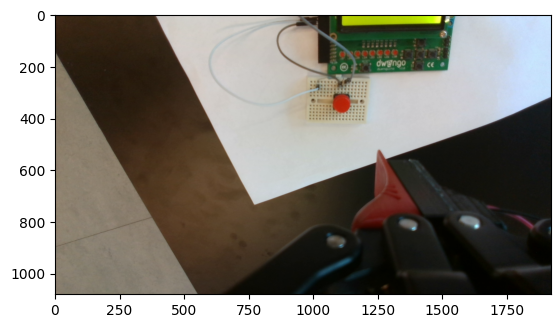

In [12]:
image = camera.get_rgb_image_as_int()

with np.printoptions(precision=1, suppress=True):
    print("Image shape:", image.shape)
    print("Image dtype:", image.dtype)


plt.imshow(camera.get_rgb_image_as_int())

In [10]:
from typing import Tuple

import cv2
import matplotlib.pyplot as plt
import numpy as np
import open3d as o3d
from airo_camera_toolkit.utils.image_converter import ImageConverter
from airo_camera_toolkit.cameras.realsense.realsense import Realsense
from airo_dataset_tools.data_parsers.pose import Pose
from airo_robots.grippers.hardware.robotiq_2f85_urcap import Robotiq2F85
from airo_robots.manipulators.hardware.ur_rtde import URrtde
from airo_spatial_algebra import SE3Container
from airo_typing import (
    CameraIntrinsicsMatrixType,
    HomogeneousMatrixType,
    NumpyDepthMapType,
    NumpyIntImageType,
    Vector2DType,
    Vector3DType,
    JointConfigurationType,
)
from airo_robots.manipulators.position_manipulator import PositionManipulator
from airo_camera_toolkit.interfaces import RGBDCamera

In [11]:
ip_address = "10.42.0.163"  # fill in the robot IP
robot = URrtde(ip_address, URrtde.UR3E_CONFIG)
gripper = Robotiq2F85(ip_address)
gripper.close().wait()
gripper.open().wait()

with np.printoptions(precision=1, suppress=True):
    print("Robot joint configuration:", np.rad2deg(robot.get_joint_configuration()), "degrees")
    print(f"Gripper width: {gripper.get_current_width():.4f} m")

Robot joint configuration: [  59.9  -70.4   50.1  -69.7  -90.  -209.7] degrees
Gripper width: 0.0839 m


In [12]:
gripper.close()

In [13]:
# robot.rtde_control.teachMode()

In [14]:
# current_img = camera.get_rgb_image_as_int() #TODO @students: get the current image from the camera
# plt.imshow(current_img)
# print(f"joint config: {robot.get_joint_configuration()}")

In [15]:
robot.rtde_control.endTeachMode()

True

In [16]:
joint_positions=[]
joint_positions.append([1.80086112,-1.71617474,0.92627412,-1.09584095,-1.8836549,-2.63405687])
joint_positions.append([0.99173224,-1.68089165,0.62467462,-1.04109986,-1.41380197,-3.40248639])
joint_positions.append([0.32339218,-1.44230221,0.62475044,-0.78069885,-1.21161396,-4.29869467])
joint_positions.append([0.61693847,-1.40380482,0.6125663,-1.10800783,-1.3066085,-3.35280353])

In [17]:
def collect_rgbd_and_tcp_pose(
    robot: PositionManipulator, camera: RGBDCamera, joints: JointConfigurationType
) -> Tuple[NumpyIntImageType, NumpyDepthMapType, HomogeneousMatrixType]:
    robot.move_to_joint_configuration(joints).wait()
    image = camera.get_rgb_image_as_int()
    depth_map = camera._retrieve_depth_map()
    X_B_TCP = robot.get_tcp_pose()
    return image, depth_map, X_B_TCP

image_depth_X_B_TCP = [collect_rgbd_and_tcp_pose(robot, camera, joints) for joints in joint_positions]




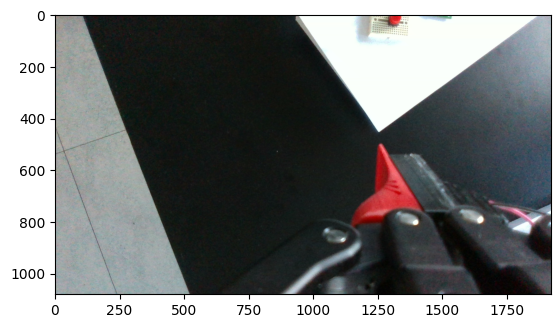

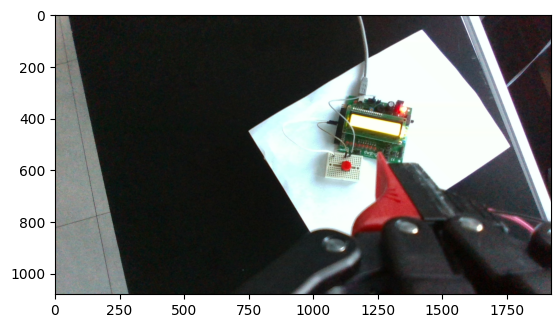

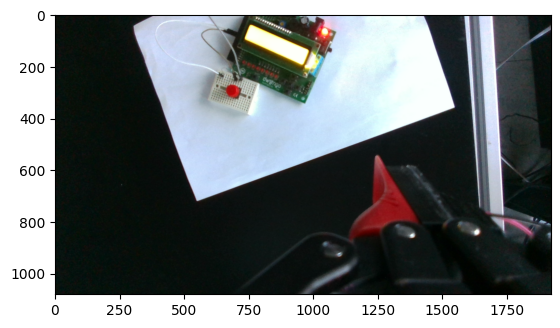

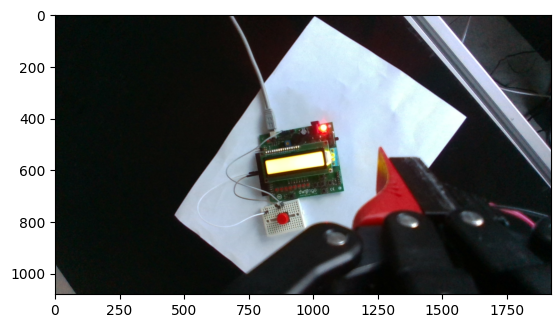

In [18]:
for img,depth,X_B_TCP in image_depth_X_B_TCP:
    plt.imshow(img)
    plt.show()

In [19]:
labels = ["red round button."]
threshold = 0.3

detector_id = "/home/rtalwar/.cache/huggingface/hub/models--IDEA-Research--grounding-dino-base/snapshots/12bdfa3120f3e7ec7b434d90674b3396eccf88eb"
segmenter_id = "/home/rtalwar/.cache/huggingface/hub/models--facebook--sam-vit-base/snapshots/70c1a07f894ebb5b307fd9eaaee97b9dfc16068f"

In [20]:

def is_red_region(crop, red_ratio_threshold=0.4):
    """
    Returns True if a significant portion of the crop is 'red'.
    """
    R = crop[:, :, 0].astype(float)
    G = crop[:, :, 1].astype(float)
    B = crop[:, :, 2].astype(float)

    # Pixels that satisfy R > G and R > B by a margin
    red_pixels = (R > 120) & (R > G + 40) & (R > B + 40)

    ratio = red_pixels.mean()
    return ratio > red_ratio_threshold

def is_round(box: BoundingBox, roundness_threshold=0.7):
    w = box.xmax - box.xmin
    h = box.ymax - box.ymin
    roundness = min(w, h) / max(w, h)
    return roundness > roundness_threshold

def filter_detections_by_shape_and_color(img, detections):
    filtered = []
    
    for det in detections:
        box = det.box
        crop = img[box.ymin:box.ymax, box.xmin:box.xmax]

        # Safety check
        if crop.size == 0:
            continue
        
        if is_red_region(crop) and is_round(det.box):
            filtered.append(det)
    
    return filtered


i'm in grounding dino


Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
Device set to use cuda


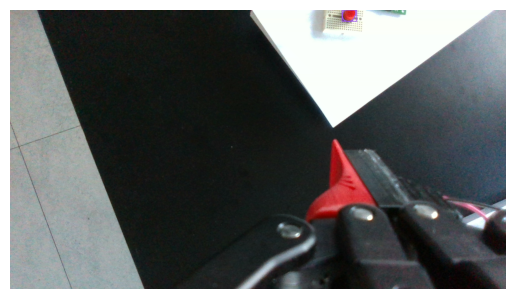

i'm in grounding dino


Device set to use cuda


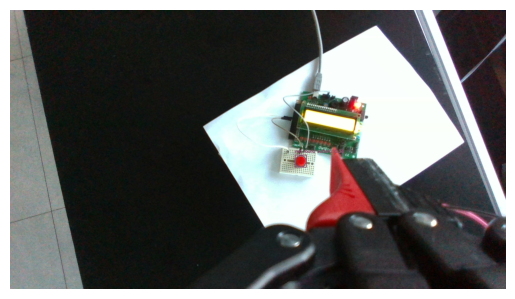

i'm in grounding dino


Device set to use cuda


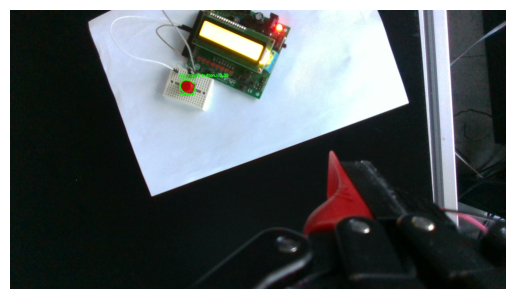

i'm in grounding dino


Device set to use cuda


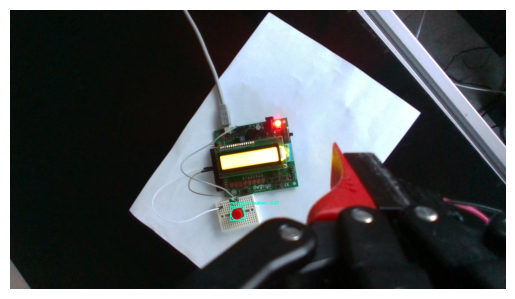

In [21]:
image_and_detections=[]

for img,depth,X_B_TCP in image_depth_X_B_TCP:
    image_array, detections = grounded_segmentation(
        image=Image.fromarray(img),
        labels=labels,
        threshold=threshold,
        polygon_refinement=True,
        detector_id=detector_id,
        segmenter_id=segmenter_id
    )
    det_filtered = filter_detections_by_shape_and_color(img, detections)
    if det_filtered:
        plot_detections(img, det_filtered, "cute_cats.png")
        image_and_detections.append((image_array, det_filtered,depth,X_B_TCP ))

Let's visualize the results:

In [22]:
# for img,det in image_and_detections:
#     plot_detections(img, det, "cute_cats.png")

In [23]:
# for img,det in image_and_detections:
#     det_filtered = filter_detections_by_shape_and_color(img, det)

#     plot_detections(img, det_filtered, "cute_cats.png")

In [24]:
from airo_dataset_tools.data_parsers.pose import Pose
camera_pose_path = "camera_pose_Park.json"

with open(camera_pose_path, "r") as f:
    camera_pose = Pose.model_validate_json(f.read()).as_homogeneous_matrix()


In [25]:
X_TCP_C = camera_pose


In [26]:
camera.intrinsics_matrix()

array([[1.37201477e+03, 0.00000000e+00, 9.67680115e+02],
       [0.00000000e+00, 1.36921521e+03, 5.58416931e+02],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [27]:
intrinsics = camera.intrinsics_matrix()

In [28]:
all_points_B = []   # list of 3D points in camera frame
for image, det, depth, X_B_TCP in image_and_detections:
    for d in det:
        # pixel center
        x_center = d.box.xmin + (d.box.xmax - d.box.xmin) / 2
        y_center = d.box.ymin + (d.box.ymax - d.box.ymin) / 2

        # depth at pixel
        Z = depth[int(y_center), int(x_center)]

        # build camera ray vector (u, v, 1)
        pixel_h = np.array([x_center, y_center, 1.0])

        # backproject into camera coordinates
        X_c = Z * (np.linalg.inv(intrinsics) @ pixel_h)

        # convert to homogeneous for transformation
        X_c_h = np.hstack([X_c, 1.0])

        # world (robot base) frame point
        X_B_C = X_B_TCP @ X_TCP_C
        X_B_h= X_B_C @ X_c_h
        if X_B_h[2]>0 and X_B_h[2]<0.5:
            print("3D point in camera frame:", X_c)
            print("3D point in base frame:", X_B_h[:3])
            all_points_B.append( X_B_h[:3])


3D point in camera frame: [ 0.10258541 -0.15959887  0.40700001]
3D point in base frame: [-0.06997492 -0.38048133  0.02993947]
3D point in camera frame: [0.05320382 0.00883904 0.46400002]
3D point in base frame: [-0.05801582 -0.38089745  0.02600203]
3D point in camera frame: [-0.07528366 -0.07039466  0.36800003]
3D point in base frame: [-0.06745655 -0.38304011  0.03376374]


In [29]:
X_B_h[2]

-3.0018583270375885

In [30]:
p_B_TCP_touch = np.mean(np.vstack(all_points_B), axis=0)   # the position where the TCP will touch your 3D point
R_B_TCP_touch_X = np.array([1,0,0])  # rotation of TCP around X-axis  
R_B_TCP_touch_Y = np.array([0,-1,0])  # rotation of TCP around Y-axis  
R_B_TCP_touch_Z = np.array([0,0,-1])  # rotation of TCP around Z-axis  

X_B_TCP_touch_se3 = SE3Container.from_orthogonal_base_vectors_and_translation(
    R_B_TCP_touch_X, R_B_TCP_touch_Y, R_B_TCP_touch_Z, p_B_TCP_touch
)
X_B_TCP_touch = X_B_TCP_touch_se3.homogeneous_matrix

X_B_TCP_touch[:3, 3] = X_B_TCP_touch[:3, 3] + np.array([0.0, 0.0, 0.1]) # add 2 cm to the z-axis to avoid colliding

In [31]:
X_B_TCP_touch

array([[ 1.        ,  0.        ,  0.        , -0.0651491 ],
       [ 0.        , -1.        ,  0.        , -0.38147296],
       [ 0.        ,  0.        , -1.        ,  0.12990175],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

In [32]:
robot.move_to_tcp_pose(X_B_TCP_touch).wait()

<ACTION_STATUS_ENUM.SUCCEEDED: 2>

In [33]:
robot.get_tcp_pose()

array([[ 9.99999985e-01, -1.73998665e-04, -6.05216478e-06,
        -6.51748155e-02],
       [-1.73999382e-04, -9.99999978e-01, -1.18655636e-04,
        -3.81474015e-01],
       [-6.03151872e-06,  1.18656687e-04, -9.99999993e-01,
         1.29957039e-01],
       [ 0.00000000e+00,  0.00000000e+00,  0.00000000e+00,
         1.00000000e+00]])

In [34]:
# import cv2
# import numpy as np

# def detect_red_button(img_bgr, target_px):
#     # Convert to HSV
#     hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
# # Hue min/max: 115 116
# # Sat min/max: 251 255
# # Val min/max: 178 185

# # Hue min/max: 115 116
# # Sat min/max: 250x
# # Val min/max: 188 203

# # Hue min/max: 113 113
# # Sat min/max: 213 231
# # Val min/max: 169 178

# # Hue min/max: 112 113
# # Sat min/max: 213 229
# # Val min/max: 172 179
#     # Two red ranges
#     lower1 = np.array([110,200,160])
#     upper1 = np.array([116,255,205])

#     mask = cv2.inRange(hsv, lower1, upper1)
#     # Morphology to reduce noise
#     kernel = np.ones((5, 5), np.uint8)
#     mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel)
#     # Contours
#     contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

#     if len(contours) == 0:
#         return None, None, None, mask

#     # Largest red contour
#     c = max(contours, key=cv2.contourArea)
#     M = cv2.moments(c)
#     if M["m00"] == 0:
#         return None, None, None, mask

#     cx = int(M["m10"] / M["m00"])
#     cy = int(M["m01"] / M["m00"])
#     center = (cx, cy)

#     # Compute pixel error
#     tx, ty = target_px
#     error_x = cx - tx
#     error_y = cy - ty
#     pixel_dist = np.sqrt(error_x**2 + error_y**2)

#     return center, (error_x, error_y), pixel_dist, mask


In [35]:
import cv2
import numpy as np
def get_robust_red_mask(hsv_img):
    # Lower Red (0-10)
    lower_red1 = np.array([0, 70, 50])
    upper_red1 = np.array([10, 255, 255])
    
    # Upper Red (170-180)
    lower_red2 = np.array([170, 70, 50])
    upper_red2 = np.array([180, 255, 255])
    
    mask1 = cv2.inRange(hsv_img, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv_img, lower_red2, upper_red2)
    
    # Combine
    mask = mask1 + mask2
    return mask
def detect_red_round_button(img_bgr, target_px):
    output = img_bgr.copy()
    mask = get_robust_red_mask(cv2.cvtColor(cv2.GaussianBlur(img_bgr, (5,5), 0), cv2.COLOR_BGR2HSV))

    # 1. Preprocess for Hough Circles (Grayscale + Blur)
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)*mask
    # Blur is crucial to avoid false circles
    gray_blurred = cv2.medianBlur(gray, 5) 

    # 2. Detect Circles
    # param1: Canny edge threshold (high)
    # param2: Accumulator threshold (lower = more circles detected)
    # minRadius/maxRadius: Adapt these to your button size in pixels!
    circles = cv2.HoughCircles(gray_blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=50,
                               param1=100, param2=30, minRadius=30, maxRadius=1000)

    best_circle = None
    
    if circles is not None:
        circles = np.round(circles[0, :]).astype("int")
        
        for (x, y, r) in circles:
            # 3. Check Color at the center of the circle
            # Create a small mask around the center to average the color
            mask = np.zeros(img_bgr.shape[:2], dtype="uint8")
            cv2.circle(mask, (x, y), int(r/2), 255, -1)
            
            # Get average color in HSV
            mean_val = cv2.mean(img_bgr, mask=mask) # Returns BGR mean
            mean_bgr = np.array([[[mean_val[0], mean_val[1], mean_val[2]]]], dtype=np.uint8)
            mean_hsv = cv2.cvtColor(mean_bgr, cv2.COLOR_BGR2HSV)[0][0]
            
            h_val = mean_hsv[0]
            s_val = mean_hsv[1]
            v_val = mean_hsv[2]

            # 4. Wide Red Filter
            # Red wraps around 180. It is usually 0-10 AND 170-180.
            # We also ensure Saturation is high enough (it's not white/grey)
            is_red = ((h_val < 10) or (h_val > 160)) and (s_val > 50) and (v_val > 50)

            if is_red:
                best_circle = (x, y)
                # Draw for visualization
                cv2.circle(output, (x, y), r, (0, 255, 0), 4)
                break # Stop after finding the first one, or add logic to find the "best" one

    if best_circle is None:
        return None, None, None, output

    # Calculate errors
    cx, cy = best_circle
    tx, ty = target_px
    error_x = cx - tx
    error_y = cy - ty
    dist = np.sqrt(error_x**2 + error_y**2)

    return best_circle, (error_x, error_y), dist, output

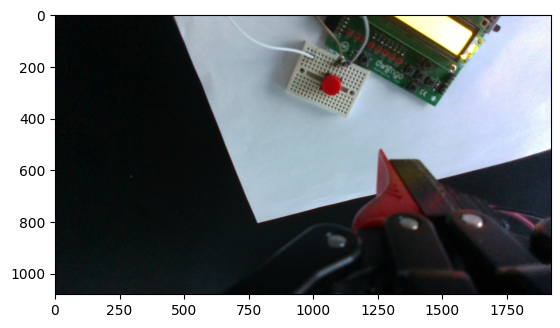

In [36]:
image = camera.get_rgb_image_as_int()
plt.imshow(image)

(1066, 275)
316 -125


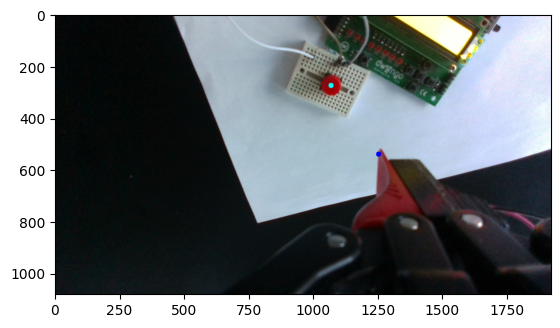

In [37]:
target_px = 750, 400
# center, (error_x, error_y), pixel_dist, mask = detect_red_button(image,target_px)
center, (error_x, error_y), pixel_dist, mask = detect_red_round_button(cv2.cvtColor(image, cv2.COLOR_RGB2BGR),target_px)
plt.imshow(mask)
print(center)
target_px = 1250, 540
image2 = cv2.circle(image.copy(),target_px, radius=10, color=(0, 0, 255), thickness=-1)
cv2.circle(image2,center, radius=10, color=(0, 255, 255), thickness=-1)
plt.imshow(image2)
print(error_x,error_y)


In [38]:
X_B_TCP

array([[ 0.77940367, -0.61859672, -0.09933792, -0.17359882],
       [-0.60196462, -0.69542483, -0.39245752, -0.39201627],
       [ 0.17369087,  0.36568074, -0.91439   ,  0.27713718],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

In [39]:
X_B_C = X_B_TCP @ X_TCP_C


In [40]:
X_B_TCP_touch

array([[ 1.        ,  0.        ,  0.        , -0.0651491 ],
       [ 0.        , -1.        ,  0.        , -0.38147296],
       [ 0.        ,  0.        , -1.        ,  0.12990175],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

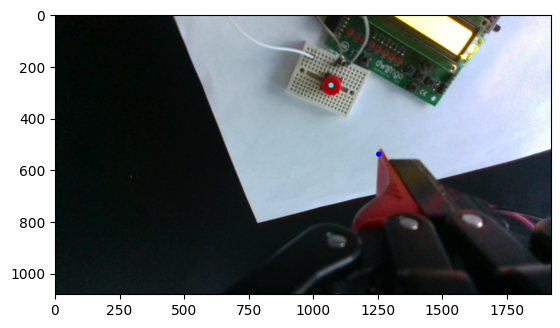

array([-0.07240162, -0.38819565,  0.036     ])

In [41]:
#we want to get button world
image = camera.get_rgb_image_as_int()
image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

# We use your previous function (ensure it is defined)
center, (error_u, error_v), pixel_dist, mask = detect_red_round_button(image_bgr, target_px)
# Draw Target (Where we want it)
image2 = cv2.circle(image.copy(), target_px, radius=10, color=(0, 0, 255), thickness=-1)
# Draw Center (Where it is)
cv2.circle(image2, center, radius=10, color=(0, 255, 255), thickness=-1)
plt.imshow(image2)
plt.show() # Make sure to show or save plot
BUTTON_Z = 0.036    #height of button in world frame  


K_inv = np.linalg.inv(intrinsics)
pixel_h = np.array([center[0], center[1], 1.0])

# ray direction in camera coords
ray_cam = K_inv @ pixel_h   # 3-vector direction (not normalized)

X_B_C = robot.get_tcp_pose() @ X_TCP_C
# X_B_C = X_TCP_C
# rotation and translation from camera -> world
R = X_B_C[:3, :3]           # rotation
t = X_B_C[:3, 3]            # camera origin in world coords


# direction in world coords
d_world = R @ ray_cam       # 3-vector

# check d_world[2] (z component) to avoid division by zero
dz = d_world[2]
if abs(dz) < 1e-8:
    raise RuntimeError("Ray is parallel to plane (dz ≈ 0), cannot intersect plane z=BUTTON_Z")

# solve for s: t_z + s * d_z = BUTTON_Z  => s = (BUTTON_Z - t_z) / d_z
s = (BUTTON_Z - t[2]) / dz
# optionally check s>0 (in front of camera)
if s <= 0:
    raise RuntimeError("Intersection behind camera (s <= 0). Check BUTTON_Z or extrinsics.")

point_world = t + s * d_world   # 3-vector world coordinates
point_world

In [42]:
# p_B_TCP_touch = point_world   # the position where the TCP will touch your 3D point
# R_B_TCP_touch_X = np.array([1,0,0])  # rotation of TCP around X-axis  
# R_B_TCP_touch_Y = np.array([0,-1,0])  # rotation of TCP around Y-axis  
# R_B_TCP_touch_Z = np.array([0,0,-1])  # rotation of TCP around Z-axis  

# X_B_TCP_touch_se3 = SE3Container.from_orthogonal_base_vectors_and_translation(
#     R_B_TCP_touch_X, R_B_TCP_touch_Y, R_B_TCP_touch_Z, p_B_TCP_touch
# )
# X_B_TCP_touch = X_B_TCP_touch_se3.homogeneous_matrix

# X_B_TCP_touch[:3, 3] = X_B_TCP_touch[:3, 3] + np.array([0.02, -0.007, 0.01]) # add 2 cm to the z-axis to avoid colliding

In [43]:
# X_B_TCP_touch

In [44]:
# def create_action(tcp_pose,button_position):
#     actions = button_position - tcp_pose[:3,3] + np.array([0.015,-0.0022, 0.005])
#     actions_in_toolspace = np.linalg.inv(tcp_pose[:3,:3])@actions # action is now in tool space
#     return actions_in_toolspace#fix offset error in tool_space

def action_to_tcp_pose(tcp_pose,action):
    final_pose = tcp_pose.copy()
    action_in_base_frame = tcp_pose[:3,:3] @ action
    final_pose[:3,3]+=action_in_base_frame
    return final_pose

In [45]:
# action= create_action(robot.get_tcp_pose(),point_world)
# print(action)
# touch = action_to_tcp_pose(robot.get_tcp_pose(),action)
# robot.move_to_tcp_pose(touch).wait()


In [46]:
# robot.move_to_tcp_pose(X_B_TCP_touch).wait()


In [47]:
# cp = X_B_TCP_touch.copy()
# cp[:3, 3] = cp[:3, 3] + np.array([+0.02, -0.007, 0.0]) # add 2 cm to the z-axis to avoid colliding
# robot.move_to_tcp_pose(cp).wait()


In [48]:
def get_button_position_world_height_known(image,BUTTON_Z,intrinsics):
        #we want to get button world
    image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)

    # We use your previous function (ensure it is defined)
    output = detect_red_round_button(image_bgr, target_px)
    if output[0] == None:
        return None

    center, (error_u, error_v), pixel_dist, mask = output
    # Draw Target (Where we want it)
    image2 = cv2.circle(image.copy(), target_px, radius=10, color=(0, 0, 255), thickness=-1)
    # Draw Center (Where it is)
    cv2.circle(image2, center, radius=10, color=(0, 255, 255), thickness=-1)
    plt.imshow(image2)
    plt.show() # Make sure to show or save plot
    #BUTTON_Z = 0.036    #height of button in world frame  


    K_inv = np.linalg.inv(intrinsics)
    pixel_h = np.array([center[0], center[1], 1.0])

    # ray direction in camera coords
    ray_cam = K_inv @ pixel_h   # 3-vector direction (not normalized)

    X_B_C = robot.get_tcp_pose() @ X_TCP_C
    # X_B_C = X_TCP_C
    # rotation and translation from camera -> world
    R = X_B_C[:3, :3]           # rotation
    t = X_B_C[:3, 3]            # camera origin in world coords


    # direction in world coords
    d_world = R @ ray_cam       # 3-vector

    # check d_world[2] (z component) to avoid division by zero
    dz = d_world[2]
    if abs(dz) < 1e-8:
        raise RuntimeError("Ray is parallel to plane (dz ≈ 0), cannot intersect plane z=BUTTON_Z")

    # solve for s: t_z + s * d_z = BUTTON_Z  => s = (BUTTON_Z - t_z) / d_z
    s = (BUTTON_Z - t[2]) / dz
    # optionally check s>0 (in front of camera)
    if s <= 0:
        raise RuntimeError("Intersection behind camera (s <= 0). Check BUTTON_Z or extrinsics.")

    point_world = t + s * d_world   # 3-vector world coordinates
    return point_world

In [49]:
X_B_TCP_touch

array([[ 1.        ,  0.        ,  0.        , -0.0651491 ],
       [ 0.        , -1.        ,  0.        , -0.38147296],
       [ 0.        ,  0.        , -1.        ,  0.12990175],
       [ 0.        ,  0.        ,  0.        ,  1.        ]])

In [50]:
def rotate_and_collect_button_positions(num_angels):
    button_positions=[]
    for i in range(num_angels):
        # Generate a random angle between 0 and 2π
        theta = -np.pi/2+ np.pi/num_angels*i
        # theta=-1.2144959500188266
        print(theta)
        # theta = 0
        # Rotation about Z-axis
        Rz = np.array([
            [np.cos(theta), -np.sin(theta), 0, 0],
            [np.sin(theta),  np.cos(theta), 0, 0],
            [0,               0,            1, 0],
            [0,               0,            0, 1]
        ])

        # Apply rotation
        X_rotated =X_B_TCP_touch @Rz 
        robot.move_to_tcp_pose(X_rotated).wait()
        image = camera.get_rgb_image_as_int()
        BUTTON_Z = 0.036
        button_position = get_button_position_world_height_known(image,BUTTON_Z,intrinsics)
        print(type(button_position))
        if isinstance(button_position,np.ndarray):
            action= create_action(robot.get_tcp_pose(),button_position)
            action
            button_positions.append(button_position)
    return button_positions

In [51]:
# # Generate a random angle between 0 and 2π
# theta = np.pi/2
# # theta=-1.2144959500188266
# print(theta)
# # theta = 0
# # Rotation about Z-axis
# Rz = np.array([
#     [np.cos(theta), -np.sin(theta), 0, 0],
#     [np.sin(theta),  np.cos(theta), 0, 0],
#     [0,               0,            1, 0],
#     [0,               0,            0, 1]
# ])

# # Apply rotation
# X_rotated =next_pose @Rz 
# robot.move_to_tcp_pose(X_rotated).wait()


In [52]:
def randomize_initial_pose(X_B_TCP_touch, 
                           xy_range=0.05, 
                           z_range=0.01):
    """
    Creates a randomized initial TCP pose (rotation + translation)
    and ensures the pose is reachable. If not, it keeps retrying.
    """
    # --- Random rotation around Z axis ---
    theta = np.random.uniform(-np.pi/2, np.pi/2)

    Rz = np.array([
        [np.cos(theta), -np.sin(theta), 0, 0],
        [np.sin(theta),  np.cos(theta), 0, 0],
        [0,               0,            1, 0],
        [0,               0,            0, 1],
    ])

    X_rotated = X_B_TCP_touch @ Rz

    # --- Random XYZ offset in BASE frame ---
    dx = np.random.uniform(-xy_range, xy_range)
    dy = np.random.uniform(-xy_range, xy_range)
    dz = np.random.uniform(0, z_range)

    offset = np.array([dx, dy, dz])
    X_rotated[:3, 3] += offset
    return X_rotated

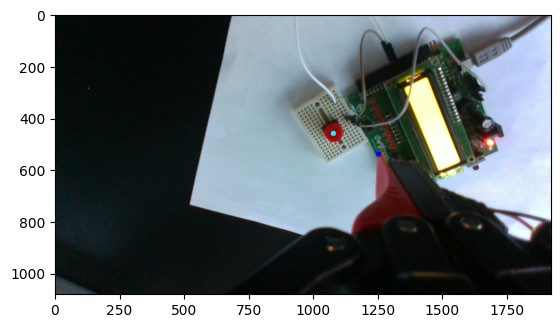

button position: [-0.07349835 -0.39765379  0.036     ]


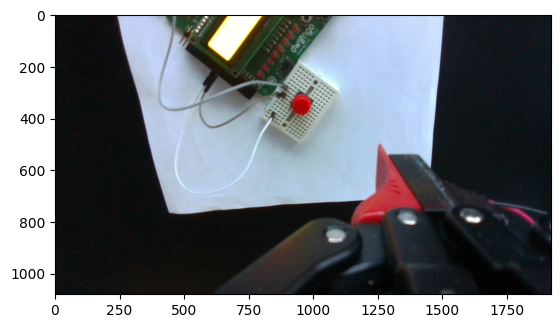

[0.04126757 0.007537   0.0901608 ]
[0.02063379 0.0037685  0.01      ]


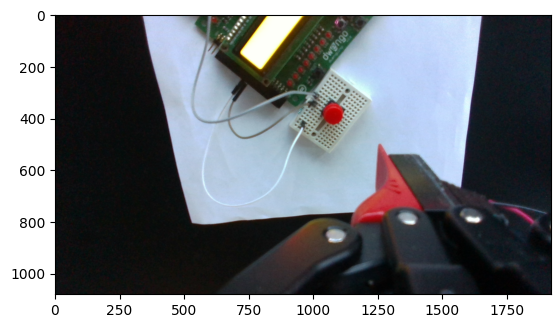

[0.02064508 0.00377429 0.08014793]
[0.01032254 0.00188715 0.01      ]


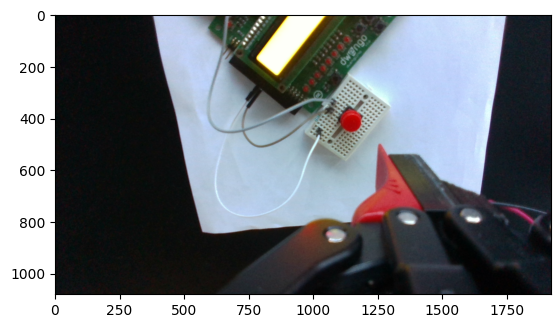

[0.01033084 0.0019065  0.0701458 ]
[0.00516542 0.00095325 0.01      ]


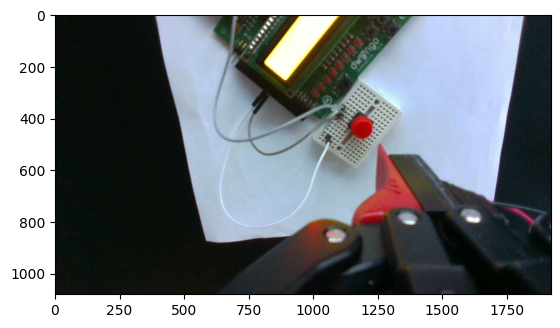

[0.00517122 0.00092472 0.06018613]
[0.00258561 0.00092472 0.01      ]


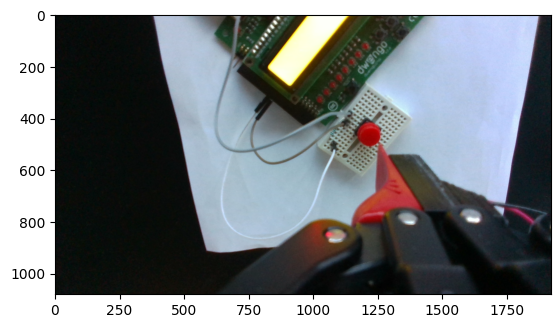

[2.57994612e-03 3.26866824e-06 5.01975720e-02]
[1.28997306e-03 3.26866824e-06 1.00000000e-02]


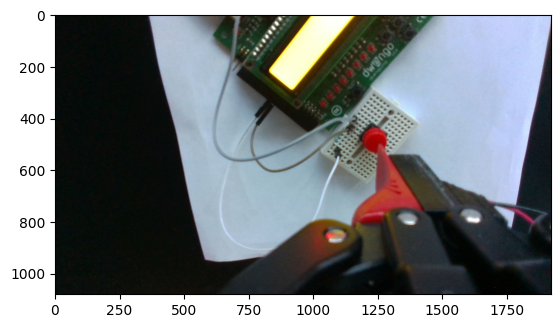

[1.28432839e-03 1.36995520e-05 4.02029198e-02]
[6.42164197e-04 1.36995520e-05 1.00000000e-02]


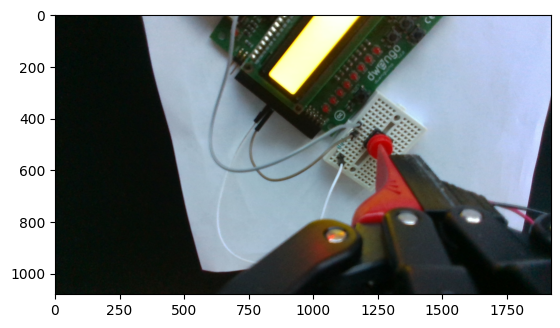

[ 6.48358078e-04 -1.03607892e-05  3.02075415e-02]
[ 6.48358078e-04 -1.03607892e-05  9.06226244e-03]


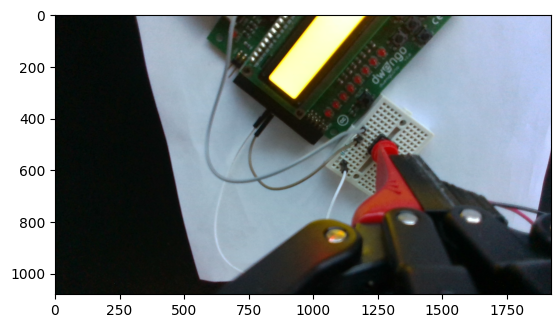

[1.76372867e-05 1.58251131e-05 2.11354279e-02]
[1.76372867e-05 1.58251131e-05 6.34062837e-03]


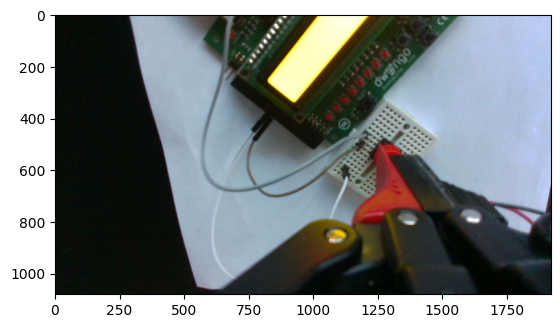

[-1.33066197e-05 -1.99323278e-05  1.47953314e-02]
[-1.33066197e-05 -1.99323278e-05  4.43859943e-03]


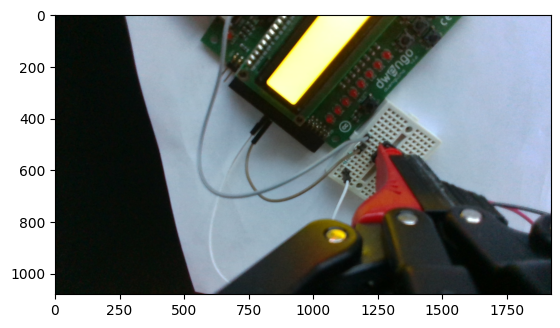

[-1.79201872e-05  1.65250175e-05  1.03609805e-02]
[-1.79201872e-05  1.65250175e-05  3.10829415e-03]
Button pushed!


In [ ]:
def create_action(tcp_pose,button_position):
    actions = button_position - tcp_pose[:3,3] + np.array([0.015,-0.011, 0.005])
    actions_in_toolspace = np.linalg.inv(tcp_pose[:3,:3])@actions # action is now in tool space
    return actions_in_toolspace#fix offset error in tool_space

import numpy as np
import cv2
import time
import matplotlib.pyplot as plt

# --- 1. SETUP MATRICES ---
# Extract focal lengths from your 3x3 intrinsics matrix
fx = intrinsics[0, 0]
fy = intrinsics[1, 1]

# Extract the Rotation Matrix (Camera -> TCP)
# X_TCP_C is the pose of the Camera in the TCP frame.
# This converts a vector from Camera Frame to TCP Frame.
R_tcp_c = X_TCP_C[:3, :3] 

BUTTON_Z = 0.036      
MIN_STEP = 0.001    
MAX_STEP = 0.01     
SPEED_GAIN = 0.3     
LATERAL_GAIN = 0.5  # Gain for X/Y correction to smooth out jitters

image = camera.get_rgb_image_as_int()

# robot.move_to_tcp_pose(X_B_TCP_touch).wait()
# button_positions = rotate_and_collect_button_positions(10)
# button_position = np.mean(button_positions,axis=0)
# button position: [ 0.04592464 -0.42571607  0.036     ]
# button_position= [ 0.0514559 , -0.43210092 , 0.036     ]
# button_position=[ 0.05058109,-0.43165259 , 0.036     ]
button_position = get_button_position_world_height_known(image,BUTTON_Z,intrinsics)
#todo if button is not visible, go up
#the offset is a real issue, need to fix this asap button height is approx, finger length is approx and then also need to change fw kinematics
print(f"button position: {button_position}")

new_pose = randomize_initial_pose(X_B_TCP_touch)
num_attempts=0
while(not robot.is_tcp_pose_reachable(new_pose) and num_attempts<20):
    num_attempts+=1
    new_pose = randomize_initial_pose(X_B_TCP_touch)

if num_attempts==20:
    print("no valid initial pose found, please verschuif the button")
    raise ValueError
robot.move_to_tcp_pose(new_pose).wait()


################################################################3
target_position = button_position 

for i in range(10):  
    # 1. Update Current State
    plt.imshow(camera.get_rgb_image_as_int())
    plt.show()
    current_tcp_pose = robot.get_tcp_pose()
    
    # 2. Calculate remaining error vector in Tool Space (re-evaluates every loop)
    # This vector represents the total distance remaining to reach the target (plus offset)
    remaining_action = create_action(current_tcp_pose, target_position)
    print(remaining_action)
    # 3. Calculate the specific 'chunk' (step) to move this iteration
    step_action = np.zeros(3)
    
    # --- X and Y Corrections ---
    # "Applied fully" implies we apply the correction, but we use the gain 
    # to smooth the motion and prevent oscillation.
    step_action[0] = remaining_action[0] if remaining_action[0] <0.001 else remaining_action[0] * LATERAL_GAIN
    step_action[1] = remaining_action[1] if remaining_action[1] <0.001 else remaining_action[1] * LATERAL_GAIN
    
    # --- Z Correction (Approach) ---
    z_dist = remaining_action[2]
    
    # Calculate speed based on distance remaining (Proportional Control)
    z_step_magnitude = abs(z_dist) * SPEED_GAIN
    
    # Logic: constant minimum step of 0.001, capped at MAX_STEP
    # We clip the step size to be between MIN_STEP and MAX_STEP
    z_step_magnitude = np.clip(z_step_magnitude, MIN_STEP, MAX_STEP)
    
    # Apply direction: preserve the sign of the original error
    # If we are very close or slightly past (due to noise), we ensure we keep 
    # pushing by enforcing the MIN_STEP in the direction of the button.
    step_action[2] = np.sign(z_dist) * z_step_magnitude
    print(step_action)
    # 4. Apply the Step
    # We subtract this small step from the current pose to move closer
    next_pose = action_to_tcp_pose(current_tcp_pose, step_action)
    
    # 5. Execute Movement
    # Using .wait() ensures we complete the small chunk before checking sensor again
    robot.move_to_tcp_pose(next_pose).wait()
    

print("Button pushed!")

In [280]:
button_position

array([ 0.05147231, -0.43153337,  0.036     ])

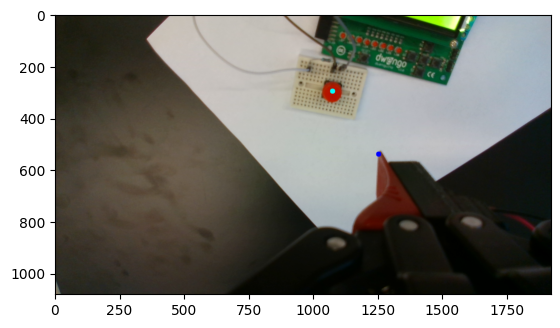

PixErr: (-178, -243), Z_Dist: 0.095
Action Base Frame: [ 0.00597674 -0.00874752 -0.01356644]


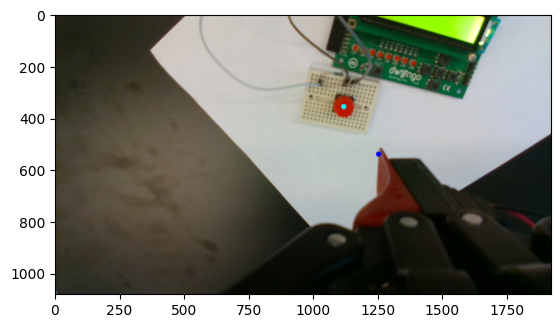

PixErr: (-135, -183), Z_Dist: 0.081
Action Base Frame: [ 0.00447587 -0.00650184 -0.01265053]


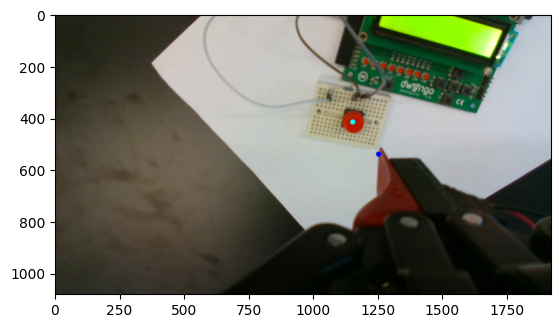

PixErr: (-100, -124), Z_Dist: 0.069
Action Base Frame: [ 0.00330178 -0.00437103 -0.01177661]


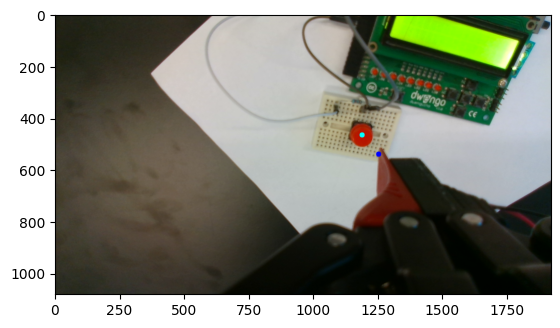

PixErr: (-64, -74), Z_Dist: 0.057
Action Base Frame: [ 0.00210076 -0.00258825 -0.01104921]


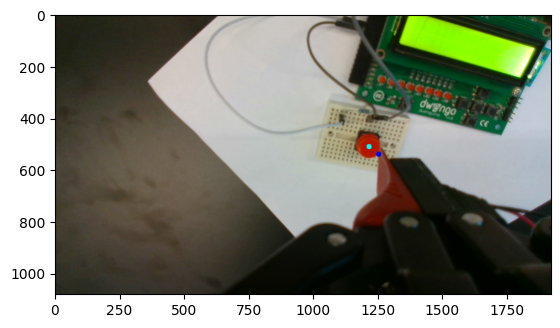

PixErr: (-37, -29), Z_Dist: 0.046
Action Base Frame: [ 0.00123341 -0.00103144 -0.01041116]


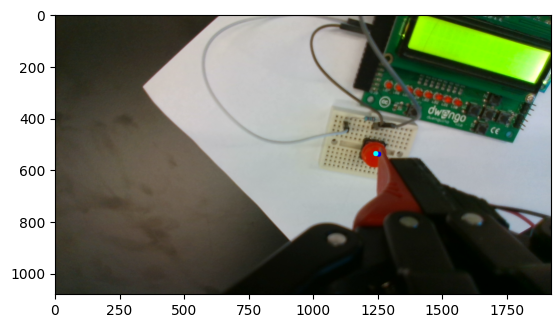

PixErr: (-11, -2), Z_Dist: 0.036
Action Base Frame: [ 3.78256768e-04 -9.04545064e-05 -1.00312936e-02]


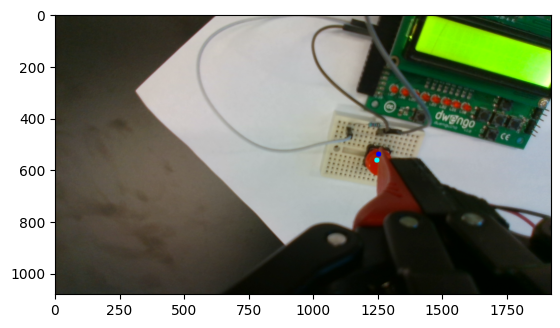

PixErr: (-7, 23), Z_Dist: 0.026
Action Base Frame: [ 0.0002945   0.00071534 -0.00737781]


TypeError: cannot unpack non-iterable NoneType object

In [ ]:
import numpy as np
import cv2
import time
import matplotlib.pyplot as plt

# --- 1. SETUP MATRICES ---
# Extract focal lengths from your 3x3 intrinsics matrix
fx = intrinsics[0, 0]
fy = intrinsics[1, 1]

# Extract the Rotation Matrix (Camera -> TCP)
# X_TCP_C is the pose of the Camera in the TCP frame.
# This converts a vector from Camera Frame to TCP Frame.
R_tcp_c = X_TCP_C[:3, :3] 

BUTTON_Z = 0.036      
MIN_STEP = 0.001    
MAX_STEP = 0.01     
SPEED_GAIN = 0.3     
LATERAL_GAIN = 0.05  # Gain for X/Y correction to smooth out jitters

robot.move_to_tcp_pose(X_B_TCP_touch).wait()


for i in range(15): # Increased iterations to ensure convergence
    # 1. Capture and Detect
    image = camera.get_rgb_image_as_int()
    image_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    
    # We use your previous function (ensure it is defined)
    center, (error_u, error_v), pixel_dist, mask = detect_red_round_button(image_bgr, target_px)
    
    if center is None:
        print("Button not detected!")
        break

    # 2. Visualization
    plt.imshow(mask)
    # Draw Target (Where we want it)
    image2 = cv2.circle(image.copy(), target_px, radius=10, color=(0, 0, 255), thickness=-1)
    # Draw Center (Where it is)
    cv2.circle(image2, center, radius=10, color=(0, 255, 255), thickness=-1)
    plt.imshow(image2)
    plt.show() # Make sure to show or save plot

    # 3. Get Robot State
    robot_pose_se3 = robot.get_tcp_pose() # Pose of TCP in Base
    R_base_tcp = robot_pose_se3[:3, :3]   # Rotation TCP -> Base
    current_z_world = robot_pose_se3[2, 3]

    # 4. Calculate Depth Estimate (Z from Camera to Button)
    # We use the vertical distance in the world frame as a scale factor.
    # We assume the button is on a flat surface at BUTTON_Z.
    dist_world_z = abs(current_z_world - BUTTON_Z)
    
    # NOTE: If the camera is tilted, the actual Z distance (optical axis) is slightly different,
    # but using the vertical world distance is stable enough for servoing.
    z_optical = dist_world_z + X_TCP_C[2,2]

    # 5. Convert Pixel Error to Camera Frame Meters (Pinhole Model)
    # x = (u * z) / fx
    # error_u is (cx - tx). Positive error means object is to the RIGHT.
    # To fix, we need to move camera RIGHT (Positive X).
    move_cam_x = (error_u * z_optical) / fx
    move_cam_y = (error_v * z_optical) / fy
    
    # Vector in Camera Optical Frame: [x, y, 0]
    # We calculate the XY correction only here. Z approach is handled separately.
    v_cam = np.array([move_cam_x, move_cam_y, 0.0])

    # 6. Transform Vector: Camera Frame -> TCP Frame
    # v_tcp = R_tcp_c * v_cam
    v_tcp = R_tcp_c @ v_cam

    # 7. Transform Vector: TCP Frame -> Base Frame
    # v_base = R_base_tcp * v_tcp
    v_base_correction = R_base_tcp @ v_tcp

    # 8. Calculate Z Descent (Vertical Approach)
    step_z = np.clip(dist_world_z * SPEED_GAIN, MIN_STEP, MAX_STEP)

    # 9. Combine Lateral Correction + Vertical Descent
    # Your robot logic is: pose -= action.
    # To move DOWN in World Z, we need to subtract a POSITIVE Z value.
    
    # Initialize action with lateral correction (scaled by gain)
    action_vector = v_base_correction * LATERAL_GAIN
    
    # Add the vertical descent component explicitly to the World Z axis
    action_vector[2] -= step_z 

    # 10. Safety: Clip total magnitude
    # if np.linalg.norm(action_vector[:1]) > MAX_STEP:
    #     action_vector = (action_vector / np.linalg.norm(action_vector)) * MAX_STEP

    print(f"PixErr: {error_u, error_v}, Z_Dist: {dist_world_z:.3f}")
    print(f"Action Base Frame: {action_vector}")

    # 11. Move Robot
    robot_pose_se3[:3, 3] += action_vector
    robot.move_to_tcp_pose(robot_pose_se3)
    
    # Stop if very close
    if dist_world_z < 0.002:
        print("Target Reached")
        break
        
    time.sleep(2)

(1076, 281)
-174 -259
Z: 0.1253172211992271, Dist: 0.08931722119922711, Action: [-0.0174  0.0259  0.01  ]
[[ 9.99999995e-01  3.14471094e-05 -9.39650104e-05 -1.31623826e-01]
 [ 3.14444394e-05 -9.99999999e-01 -2.84167845e-05 -3.60582229e-01]
 [-9.39659039e-05  2.84138297e-05 -9.99999995e-01  1.25326716e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
(1184, 437)
-66 -103
Z: 0.11533745818278576, Dist: 0.07933745818278576, Action: [-0.0066  0.0103  0.01  ]
[[ 9.99999991e-01  2.10749357e-05 -1.31718576e-04 -1.14254640e-01]
 [ 2.10680820e-05 -9.99999998e-01 -5.20339083e-05 -3.86484768e-01]
 [-1.31719672e-04  5.20311328e-05 -9.99999990e-01  1.15324185e-01]
 [ 0.00000000e+00  0.00000000e+00  0.00000000e+00  1.00000000e+00]]
(1235, 515)
-15 -25
Z: 0.10531273042393618, Dist: 0.06931273042393618, Action: [-0.0015  0.0025  0.01  ]
[[ 9.99999991e-01  7.02177497e-07 -1.30660845e-04 -1.07641287e-01]
 [ 6.87634767e-07 -9.99999994e-01 -1.11301370e-04 -3.96807386e-01]
 [-1.306609

TypeError: cannot unpack non-iterable NoneType object

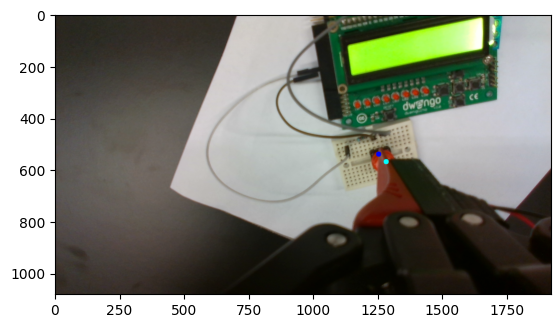

In [ ]:
robot.move_to_tcp_pose(X_B_TCP_touch).wait()
import time
BUTTON_Z = 0.036      # The height of the button
MIN_STEP = 0.001    # Minimum movement step (when very close)
MAX_STEP = 0.01     # Maximum movement step (when far away)
SPEED_GAIN = 0.3     # How quickly speed increases with distance (higher = faster acceleration)
for i in range(10):
    image = camera.get_rgb_image_as_int()
    center, (error_x, error_y), pixel_dist, mask = detect_red_round_button(cv2.cvtColor(image, cv2.COLOR_RGB2BGR),target_px)
    if center==None:
        break
    plt.imshow(mask)
    print(center)
    target_px = 1250, 540
    image2 = cv2.circle(image.copy(),target_px, radius=10, color=(0, 0, 255), thickness=-1)
    cv2.circle(image2,center, radius=10, color=(0, 255, 255), thickness=-1)
    plt.imshow(image2)
    print(error_x,error_y)
    robot_pose_se3 = robot.get_tcp_pose()
    # --- ADAPTIVE ACTION CALCULATION ---
    # 1. Get current Z height
    current_z = robot.get_tcp_pose()[2,3]
    # 2. Calculate distance to button
    # We use abs() to ensure positive distance even if we overshoot slightly below 0.04
    distance = abs(current_z - BUTTON_Z)

    # 3. Calculate step size (Proportional Control)
    # Speed = Gain * Distance
    step_size = distance * SPEED_GAIN

    # 4. Clip step size to ensure we don't stall (min) or move too dangerously fast (max)
    dz = np.clip(step_size, MIN_STEP, MAX_STEP)
    dx = error_x/10000
    dy = error_y/10000*-1
    # 5. Apply Direction
    # if down:
    current_action = np.array([dx,dy,dz], dtype=np.float64)
    # else:
    #     current_action = np.array([-step_size], dtype=np.float64)

    # Log the speed for debugging
    print(f"Z: {current_z}, Dist: {distance}, Action: {current_action}")

    robot_pose_se3[:3, 3] -= current_action
    robot.move_to_tcp_pose(robot_pose_se3)
    print(robot.get_tcp_pose())
    time.sleep(5)


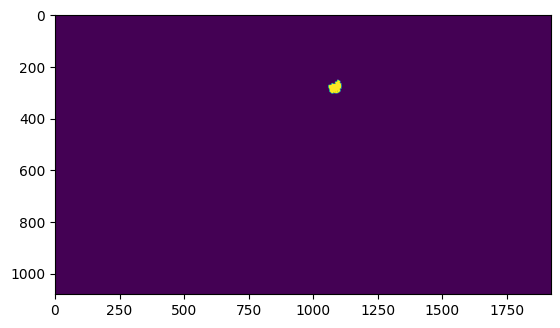

In [ ]:
plt.imshow(mask)

In [ ]:
detect_red_button(image,target_px)

(None,
 None,
 None,
 array([[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]], dtype=uint8))

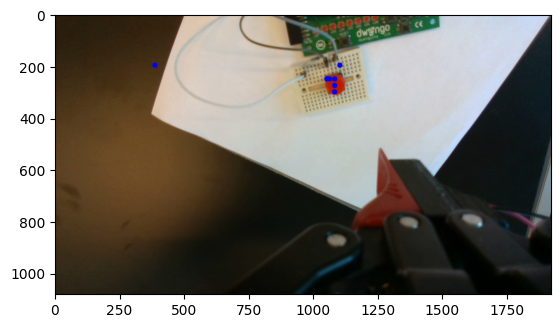

In [ ]:
target_px = 1250, 540
image2 = cv2.circle(image, (1080, 275), radius=10, color=(0, 0, 255), thickness=-1)
plt.imshow(image2)

Hue min/max: 80 80
Sat min/max: 8 8
Val min/max: 194 197


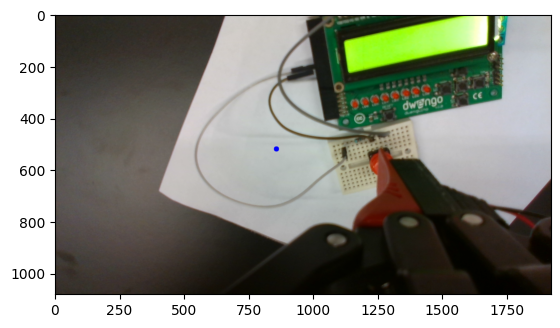

RTDEControlInterface: Could not receive data from robot...
RTDEControlInterface Exception: Operation canceled
RTDEControlInterface: Robot is disconnected, reconnecting...
RTDEReceiveInterface boost system Exception: (system:125) Operation canceled


Reconnecting...


RTDEControlInterface Exception: Timeout connecting to UR dashboard server.


In [ ]:

hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

# Sample a small region manually around the approximate button center
# (center from my earlier run was ~386,197)
cx, cy = 855, 520
image2 = cv2.circle(image.copy(), (cx, cy), radius=10, color=(0, 0, 255), thickness=-1)
plt.imshow(image2)
patch = hsv[cy-10:cy+10, cx-10:cx+10].reshape(-1,3)
print("Hue min/max:", patch[:,0].min(), patch[:,0].max())
print("Sat min/max:", patch[:,1].min(), patch[:,1].max())
print("Val min/max:", patch[:,2].min(), patch[:,2].max())


In [68]:
def get_robust_red_mask(hsv_img):
    # Lower Red (0-10)
    lower_red1 = np.array([0, 70, 50])
    upper_red1 = np.array([10, 255, 255])
    
    # Upper Red (170-180)
    lower_red2 = np.array([170, 70, 50])
    upper_red2 = np.array([180, 255, 255])
    
    mask1 = cv2.inRange(hsv_img, lower_red1, upper_red1)
    mask2 = cv2.inRange(hsv_img, lower_red2, upper_red2)
    
    # Combine
    mask = mask1 + mask2
    return mask
def detect_blob(img_bgr):
    params = cv2.SimpleBlobDetector_Params()

    # Filter by Area (size of button)
    params.filterByArea = True
    params.minArea = 20
    params.maxArea = 5000000

    # Filter by Circularity (0 = line, 1 = perfect circle)
    params.filterByCircularity = True
    params.minCircularity = 0.7

    # Filter by Convexity (excludes weird shapes)
    params.filterByConvexity = True
    params.minConvexity = 0.9
    
    # Filter by Color (0 for dark blobs, 255 for light blobs)
    # This is tricky for specific colors, so we usually run this on a Mask.
    
    detector = cv2.SimpleBlobDetector_create(params)
    # Run your color mask FIRST, then detect blobs on the mask
    keypoints = detector.detect(img_bgr) 
    
    return keypoints

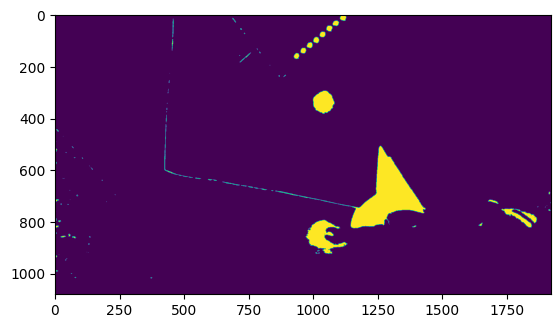

In [69]:
image = camera.get_rgb_image_as_int()
mask=get_robust_red_mask(cv2.cvtColor(cv2.GaussianBlur(image, (5,5), 0), cv2.COLOR_RGB2HSV))
plt.imshow(mask)
# kpts=detect_blob(mask)

(102.31446838378906, 805.2012329101562)


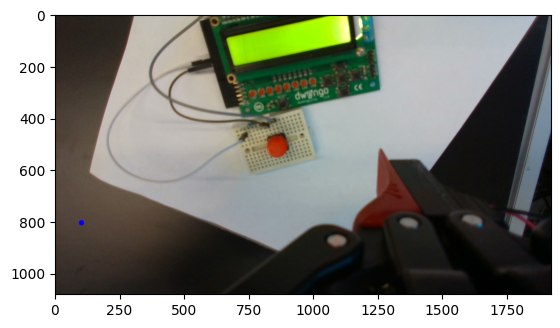

In [74]:
dotted_image = image.copy()
for kpt in kpts:
    print(kpt.pt)
    dotted_image = cv2.circle(dotted_image, (int(kpt.pt[0]),int(kpt.pt[1])), radius=10, color=(0, 0, 255), thickness=-1)
plt.imshow(dotted_image)

(1310, 76)
60 -464


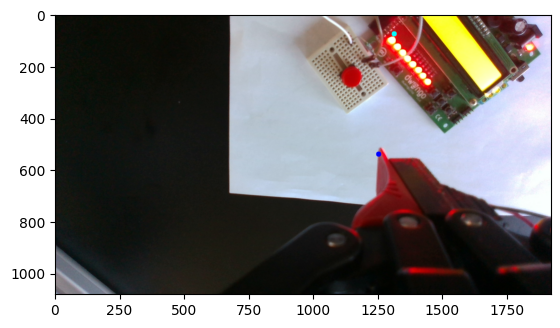

In [81]:
center, (error_x, error_y), pixel_dist, mask = detect_red_round_button(cv2.cvtColor(image, cv2.COLOR_RGB2BGR),target_px)
plt.imshow(mask)
print(center)
target_px = 1250, 540
image2 = cv2.circle(image.copy(),target_px, radius=10, color=(0, 0, 255), thickness=-1)
cv2.circle(image2,center, radius=10, color=(0, 255, 255), thickness=-1)
plt.imshow(image2)
print(error_x,error_y)



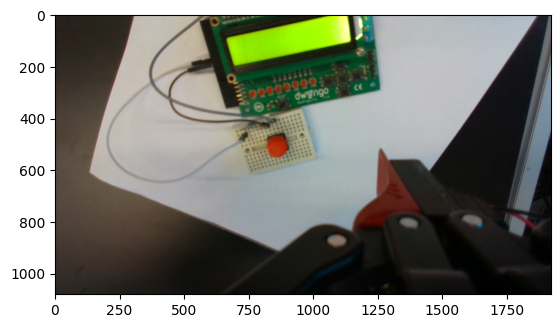

In [88]:
plt.imshow(image)

In [214]:
image = camera.get_rgb_image_as_int()
img_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
output = img_bgr.copy()

mask = get_robust_red_mask(cv2.cvtColor(cv2.GaussianBlur(img_bgr, (5,5), 0), cv2.COLOR_BGR2HSV))
# 1. Preprocess for Hough Circles (Grayscale + Blur)
gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)*mask
# Blur is crucial to avoid false circles
gray_blurred = cv2.medianBlur(gray, 5) 

# 2. Detect Circles
# param1: Canny edge threshold (high)
# param2: Accumulator threshold (lower = more circles detected)
# minRadius/maxRadius: Adapt these to your button size in pixels!
circles = cv2.HoughCircles(gray_blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=50,
                        param1=100, param2=30, minRadius=30, maxRadius=80)
circles = np.round(circles[0, :]).astype("int")
mask_final = img_bgr.copy()
print(circles)
for x,y,r in circles:
    # mask = np.zeros(img_bgr.shape[:2], dtype="uint8")
    # cv2.circle(mask, (x, y), int(r/2), 255, -1)
    # # Get average color in HSV
    # mean_val = cv2.mean(img_bgr, mask=mask) # Returns BGR mean
    # mean_bgr = np.array([[[mean_val[0], mean_val[1], mean_val[2]]]], dtype=np.uint8)
    # mean_hsv = cv2.cvtColor(mean_bgr, cv2.COLOR_BGR2HSV)[0][0]
    # print(mean_hsv)
    # h_val = mean_hsv[0]
    # s_val = mean_hsv[1]
    # v_val = mean_hsv[2]

    # # 4. Wide Red Filter
    # # Red wraps around 180. It is usually 0-10 AND 170-180.
    # # We also ensure Saturation is high enough (it's not white/grey)
    # is_red = ((h_val < 10) or (h_val > 160)) and (s_val > 50) and (v_val > 50)

    # if is_red:
    #     best_circle = (x, y)
    #     # Draw for visualization
    #     cv2.circle(mask, (x, y), r, (0, 255, 0), 4)
    #     # break # Stop after finding the first one, or add logic to find the "best" one
    #     # cv2.circle(mask_final, (x, y), r, (0, 255, 0), 4)

    cv2.circle(mask_final, (x, y), int(r/2), 255, -1)
# cv2.circle(mask_final, best_circle, radius=10, color=(0,255,255), thickness=-1)
plt.imshow(mask_final)

TypeError: 'NoneType' object is not subscriptable

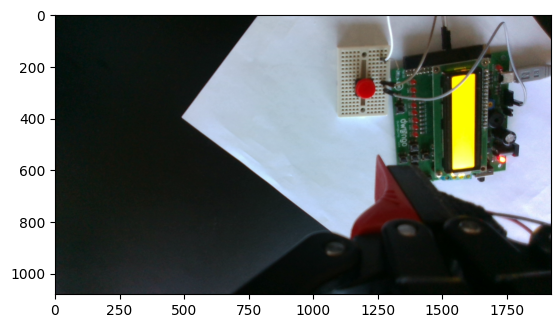

In [215]:
plt.imshow(image)

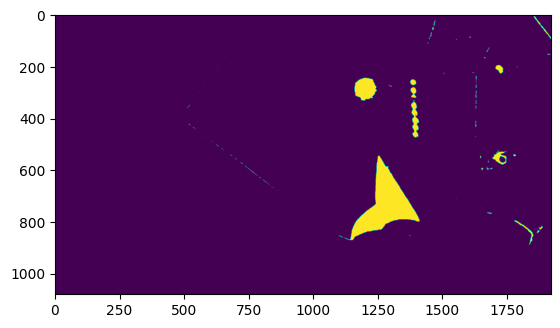

In [216]:
plt.imshow(mask)

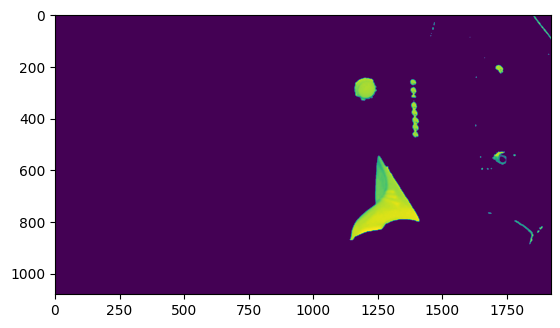

In [217]:
plt.imshow(gray_blurred)

[[1198  284   42]]


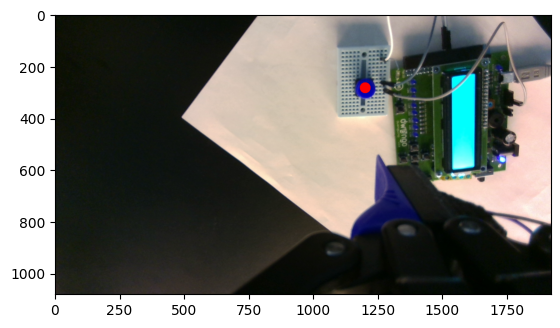

In [252]:
# plt.imshow(gray_blurred)
circles = cv2.HoughCircles(gray_blurred, cv2.HOUGH_GRADIENT, dp=1.2, minDist=50,
                        param1=100, param2=30, minRadius=30, maxRadius=1000)
circles = np.round(circles[0, :]).astype("int")
mask_final = img_bgr.copy()
print(circles)
for x,y,r in circles:
    # mask = np.zeros(img_bgr.shape[:2], dtype="uint8")
    # cv2.circle(mask, (x, y), int(r/2), 255, -1)
    # # Get average color in HSV
    # mean_val = cv2.mean(img_bgr, mask=mask) # Returns BGR mean
    # mean_bgr = np.array([[[mean_val[0], mean_val[1], mean_val[2]]]], dtype=np.uint8)
    # mean_hsv = cv2.cvtColor(mean_bgr, cv2.COLOR_BGR2HSV)[0][0]
    # print(mean_hsv)
    # h_val = mean_hsv[0]
    # s_val = mean_hsv[1]
    # v_val = mean_hsv[2]

    # # 4. Wide Red Filter
    # # Red wraps around 180. It is usually 0-10 AND 170-180.
    # # We also ensure Saturation is high enough (it's not white/grey)
    # is_red = ((h_val < 10) or (h_val > 160)) and (s_val > 50) and (v_val > 50)

    # if is_red:
    #     best_circle = (x, y)
    #     # Draw for visualization
    #     cv2.circle(mask, (x, y), r, (0, 255, 0), 4)
    #     # break # Stop after finding the first one, or add logic to find the "best" one
    #     # cv2.circle(mask_final, (x, y), r, (0, 255, 0), 4)

    cv2.circle(mask_final, (x, y), int(r/2), 255, -1)
# cv2.circle(mask_final, best_circle, radius=10, color=(0,255,255), thickness=-1)
plt.imshow(mask_final)

In [202]:
image = camera.get_rgb_image_as_int()
img_bgr = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
detect_red_round_button(img_bgr,[0,0])

(None,
 None,
 None,
 array([[[ 7, 18, 16],
         [ 6, 17, 15],
         [ 7, 18, 16],
         ...,
         [11, 17, 17],
         [ 8, 15, 24],
         [ 8, 15, 24]],
 
        [[ 6, 17, 15],
         [ 6, 17, 15],
         [ 6, 17, 15],
         ...,
         [11, 17, 17],
         [ 7, 15, 22],
         [ 7, 15, 22]],
 
        [[ 9, 18, 17],
         [ 6, 15, 14],
         [ 6, 15, 13],
         ...,
         [11, 17, 16],
         [10, 17, 21],
         [10, 17, 21]],
 
        ...,
 
        [[51, 38, 50],
         [49, 36, 48],
         [47, 37, 47],
         ...,
         [ 1,  7,  0],
         [ 2,  8,  1],
         [ 2,  8,  1]],
 
        [[56, 40, 57],
         [54, 38, 55],
         [53, 40, 52],
         ...,
         [ 1,  7,  0],
         [ 2,  8,  1],
         [ 2,  8,  1]],
 
        [[56, 39, 58],
         [54, 37, 56],
         [53, 40, 54],
         ...,
         [ 2,  8,  1],
         [ 2,  8,  1],
         [ 5, 11,  4]]], dtype=uint8))

In [117]:
5

5